In [5]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from keras.models import Model
from keras.layers import Input, Add, Dense, Dropout, Activation, ZeroPadding2D, BatchNormalization, Concatenate, Flatten, Conv2D, AveragePooling2D, MaxPool2D, Reshape, Conv2DTranspose
import os
import random
import numpy as np
from skimage.io import imread
from skimage.transform import resize
import matplotlib.pyplot as plt
from tqdm import tqdm 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
# Set seed for reproducibility
seed = 42
random.seed(seed)
tf.random.set_seed(seed)

## Load Images

In [7]:
seed = 2023
np.random.seed = seed

IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3

TRAIN_PATH = './data/stage1_train/'
#TEST_PATH = './data/stage1_test/'

train_ids = next(os.walk(TRAIN_PATH))[1]
#test_ids = next(os.walk(TEST_PATH))[1]

X = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
y = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)



In [8]:
for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):   
    path = TRAIN_PATH + id_

    img = imread(path + '/images/' + id_ + '.png')[:,:,:IMG_CHANNELS]  
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)

    X[n] = img

    mask = np.zeros((IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)

    for mask_file in next(os.walk(path + '/masks/'))[2]:
        mask_ = imread(path + '/masks/' + mask_file)
        mask_ = np.expand_dims(resize(mask_, (IMG_HEIGHT, IMG_WIDTH), mode='constant',  
                                      preserve_range=True), axis=-1)
        mask = np.maximum(mask, mask_)  
            
    y[n] = mask 

100%|██████████| 670/670 [21:03<00:00,  1.89s/it] 


## EDA

Look if they are i.i.d -> independent and identically distributed

In [9]:
print(X.shape)
print(y.shape)

(670, 128, 128, 3)
(670, 128, 128, 1)


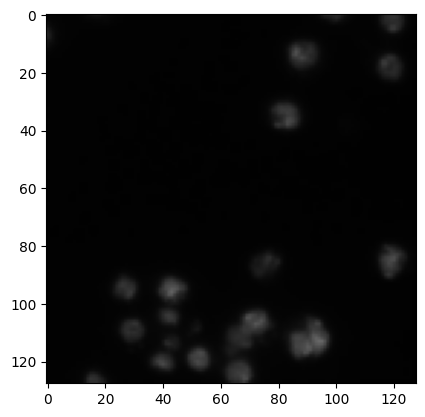

In [10]:
plt.imshow(X[0])

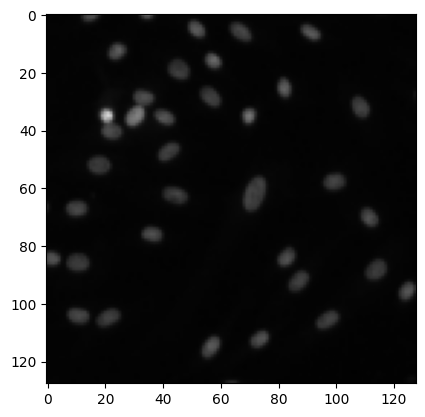

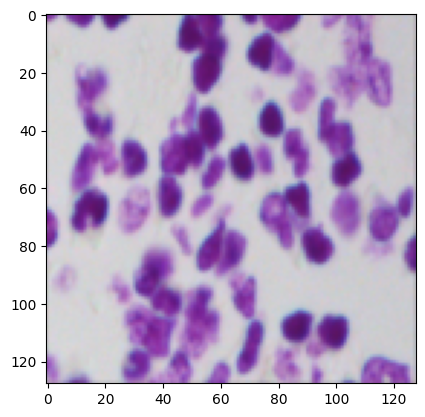

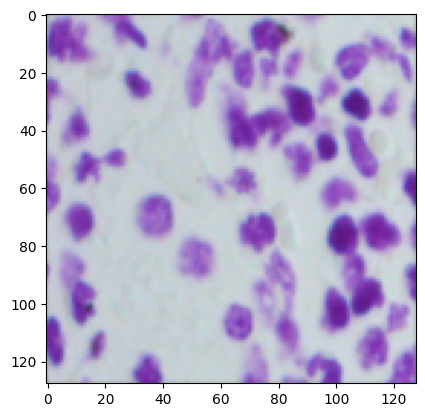

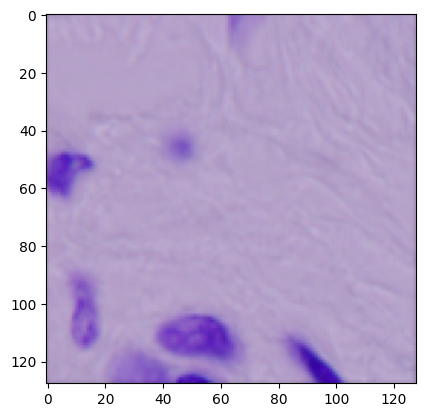

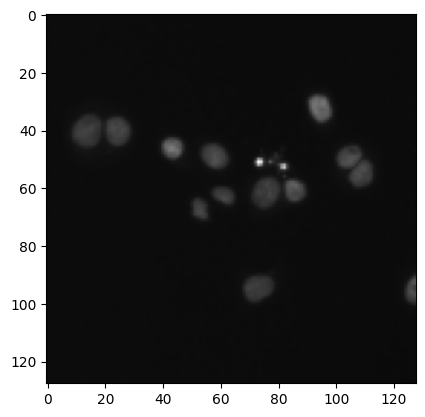

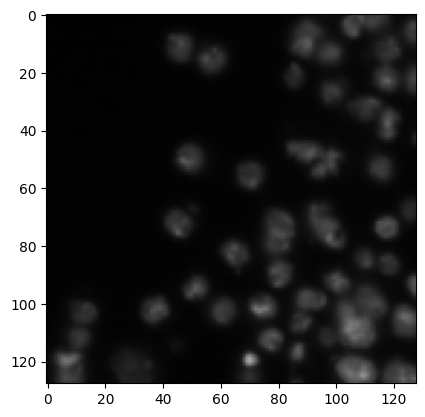

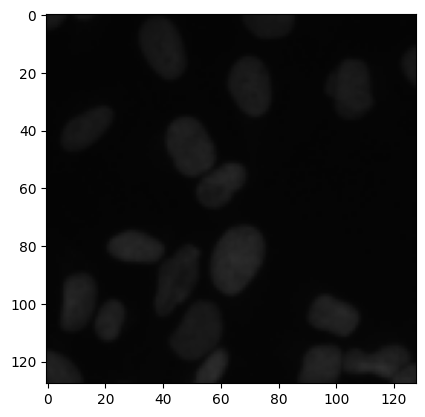

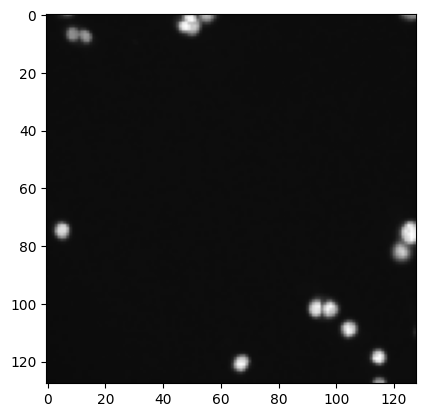

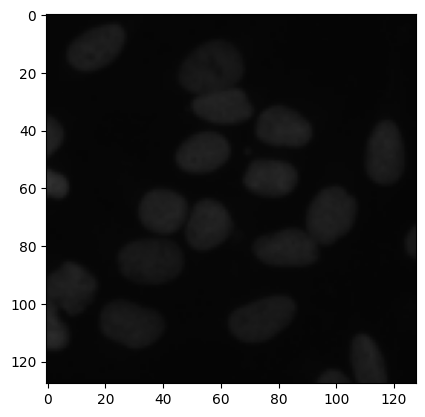

In [11]:
for i in range(1, 10):
    plt.imshow(X[i])
    plt.show()

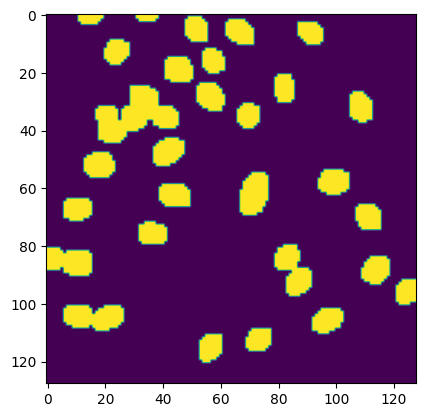

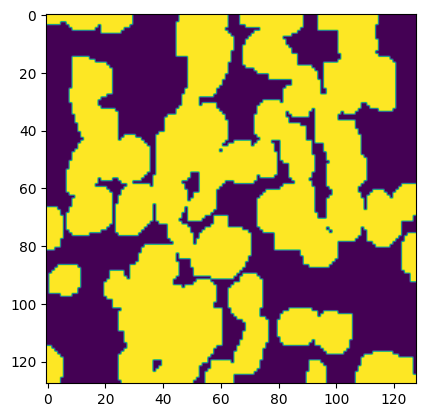

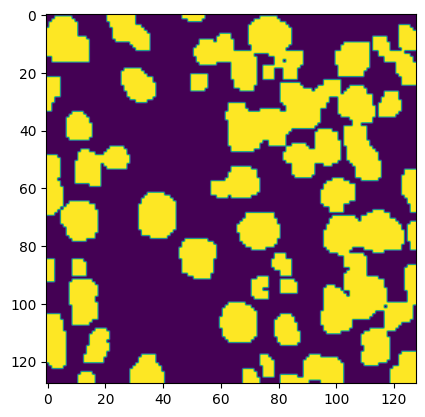

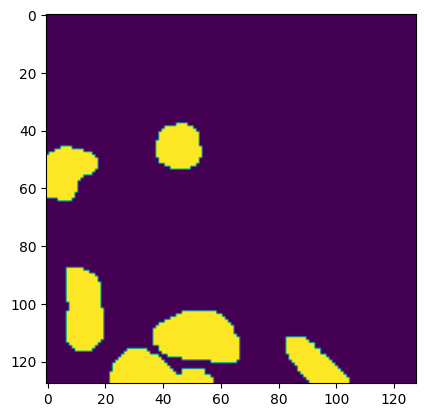

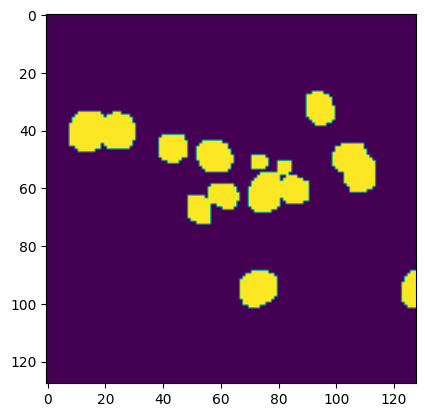

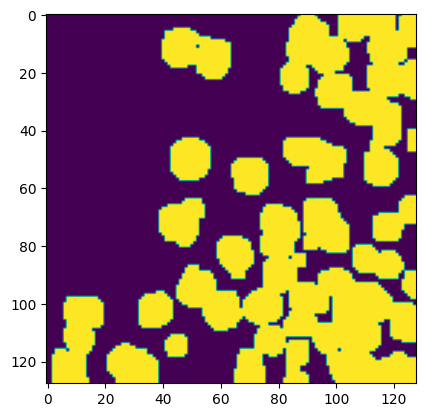

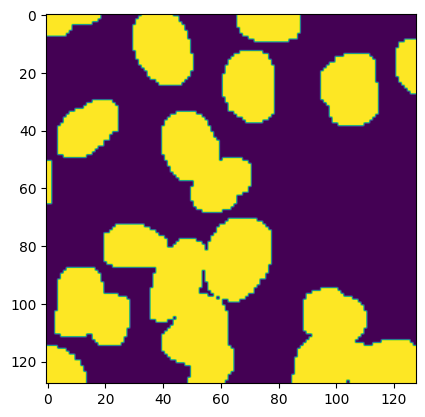

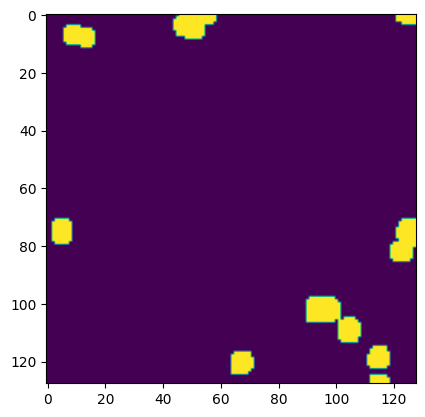

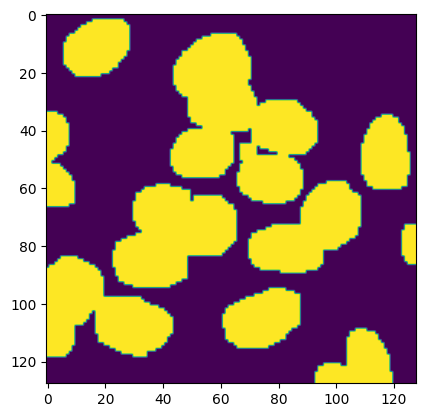

In [12]:
for i in range(1, 10):
    plt.imshow(y[i])
    plt.show()

In [13]:
# Save in a folder all X images
#for i in range(0, len(X)):
#    plt.imsave('./data/X/' + str(i) + '.png', X[i])


From saving every image, we can see that clearly the images are not indentically distributed as they vary in size, shape and color.

In [14]:
# Create a table with the image name, width, height and number of masks for each image in X 
dataPD = pd.DataFrame(columns=['Image', 'Width', 'Height', 'Masks'])
for i in range(0, len(X)):
    dataPD.loc[i] = [i, X[i].shape[0], X[i].shape[1], y[i].shape[2]]

dataPD.to_csv('./data/data.csv', index=False)

In [15]:
print(dataPD)

     Image  Width  Height  Masks
0        0    128     128      1
1        1    128     128      1
2        2    128     128      1
3        3    128     128      1
4        4    128     128      1
..     ...    ...     ...    ...
665    665    128     128      1
666    666    128     128      1
667    667    128     128      1
668    668    128     128      1
669    669    128     128      1

[670 rows x 4 columns]


## Preprocessing Tests

### Greyscale: 
When transforming images to gray, purple images are flipped and the nuclei is black, instead of white.
https://tdlc.ucsd.edu/SV2013/Kanan_Cottrell_PLOS_Color_2012.pdf

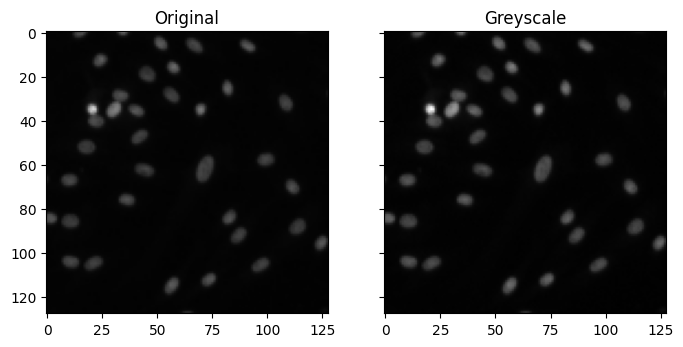

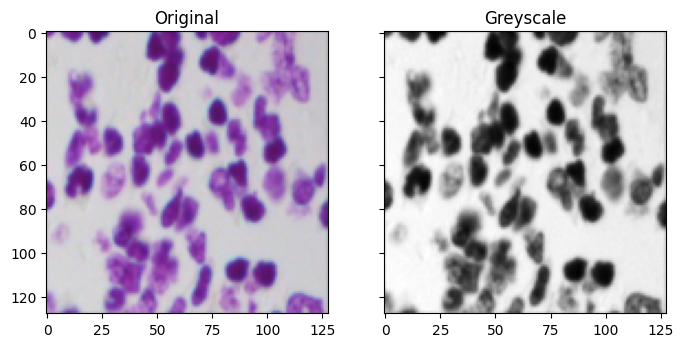

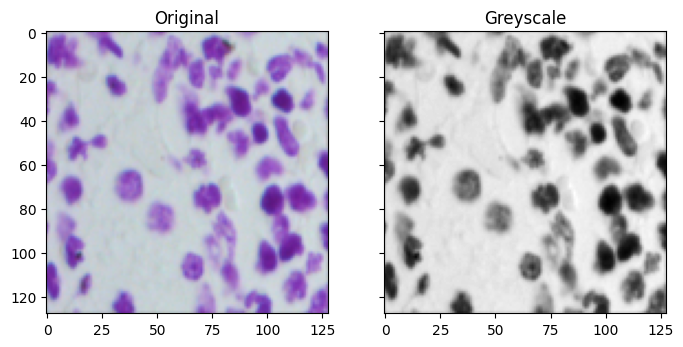

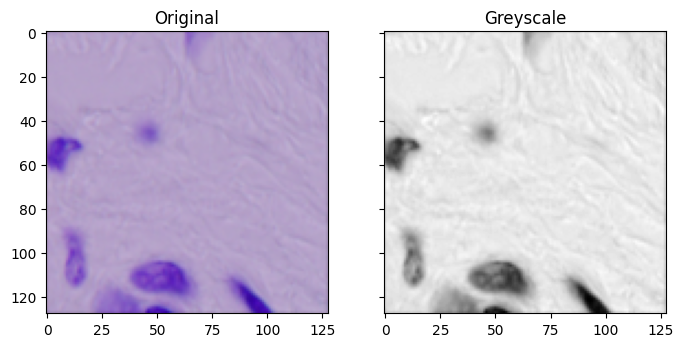

In [16]:
# Transform all images to grayscale
X_greyscale = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)
for i in range(0, len(X)):
    X_greyscale[i] = np.dot(X[i][...,:3], [0.2989, 0.5870, 0.1140])

for i in range(1, 5):
    fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True,
                         figsize=(8, 4))
    axes[0].imshow(X[i], cmap=plt.get_cmap('gray'))
    axes[0].set_title('Original')
    axes[1].imshow(X_greyscale[i], cmap=plt.get_cmap('gray'))
    axes[1].set_title('Greyscale')


### Brightness: 
Black/White images improve in clarity, however purple images add a lot of noise. This noise looks like it appears when brightness > 25, however only looked at little sample.

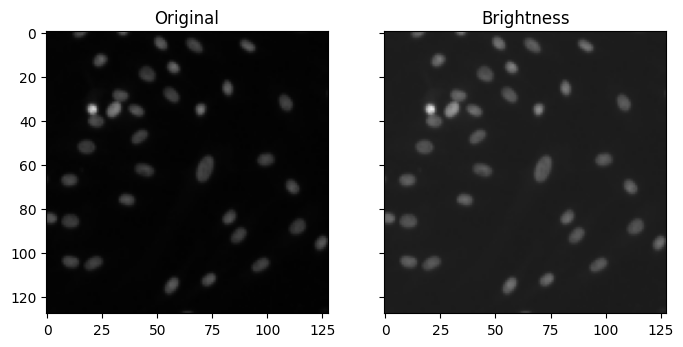

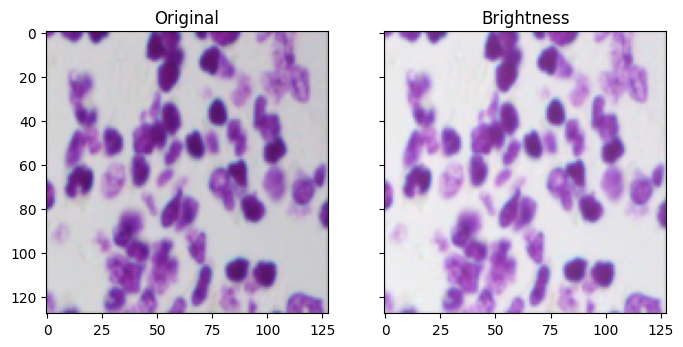

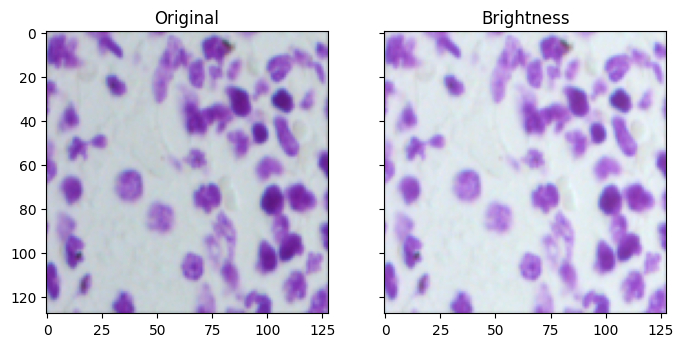

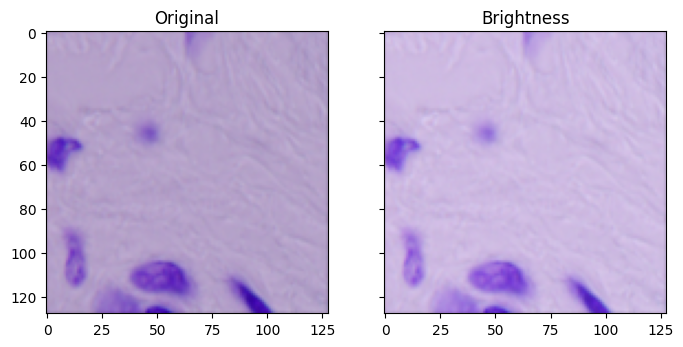

In [17]:
#Increase brightness of images
X_bright = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
for i in range(0, len(X)):
    X_bright[i] = X[i] + 25

for i in range(1, 5):
    fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True,
                         figsize=(8, 4))
    axes[0].imshow(X[i], cmap=plt.get_cmap('gray'))
    axes[0].set_title('Original')
    axes[1].imshow(X_bright[i], cmap=plt.get_cmap('gray'))
    axes[1].set_title('Brightness')

### Grayscale + Brightness: 
Same noise is added to white/black(purple) images.

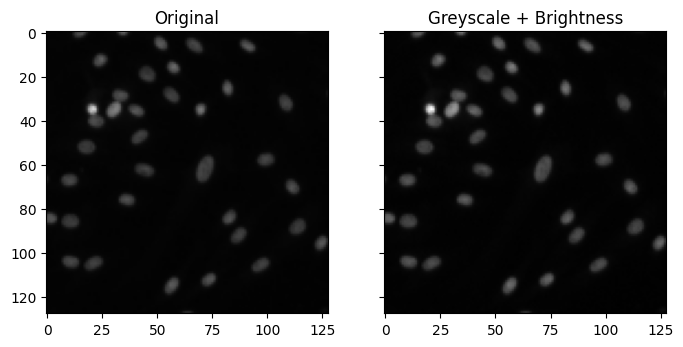

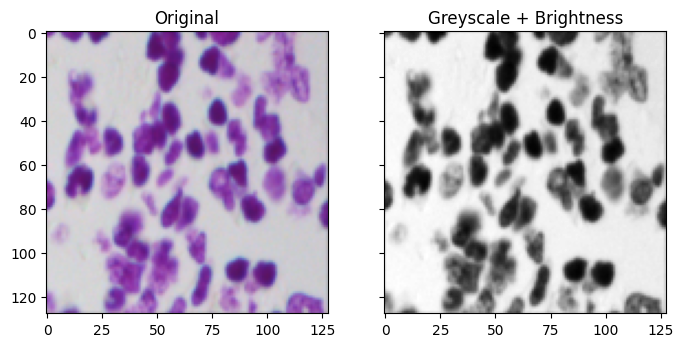

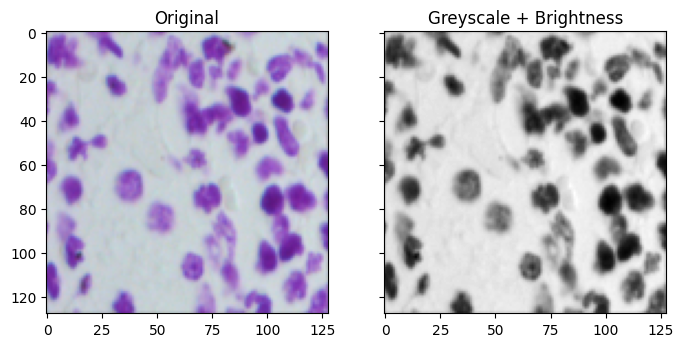

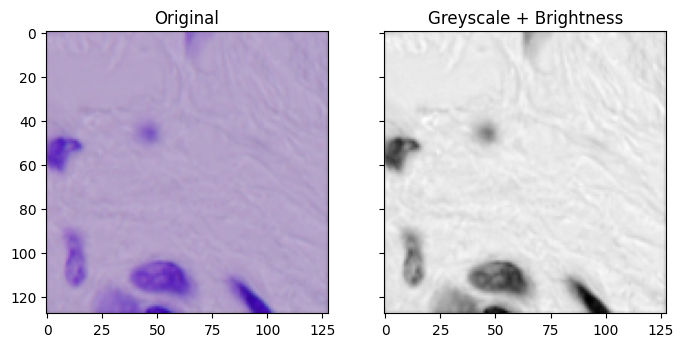

In [18]:
#Greyscale + Brightness
X_greyscale_bright = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)
for i in range(0, len(X)):
    X_greyscale_bright[i] = np.dot(X[i][...,:3], [0.2989, 0.5870, 0.1140])
    X_greyscale_bright[i] = X_greyscale_bright[i] + 25

for i in range(1, 5):
    fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True,
                         figsize=(8, 4))
    axes[0].imshow(X[i], cmap=plt.get_cmap('gray'))
    axes[0].set_title('Original')
    axes[1].imshow(X_greyscale_bright[i], cmap=plt.get_cmap('gray'))
    axes[1].set_title('Greyscale + Brightness')

### High contrast: 
Not so good, does differentiate clearly the nuclei but adds noise.

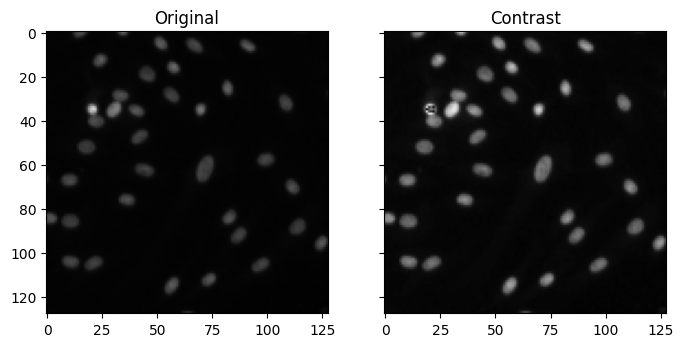

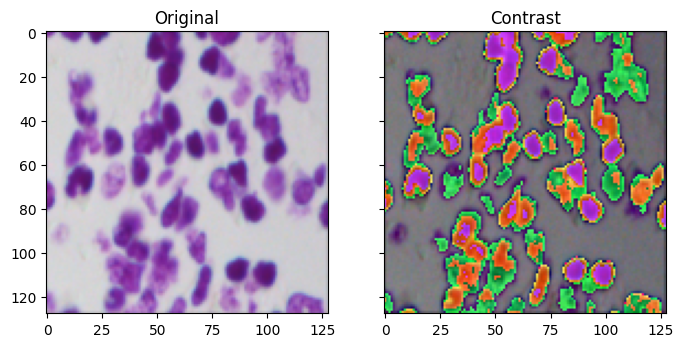

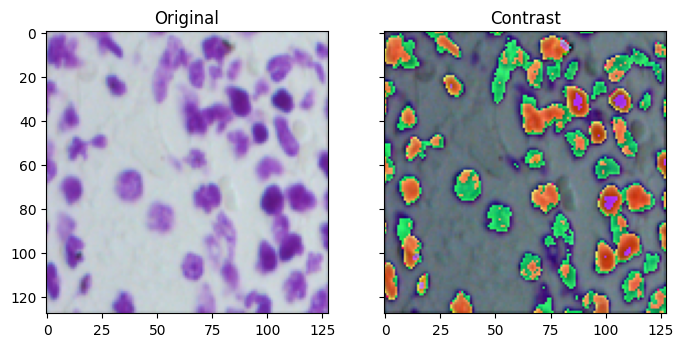

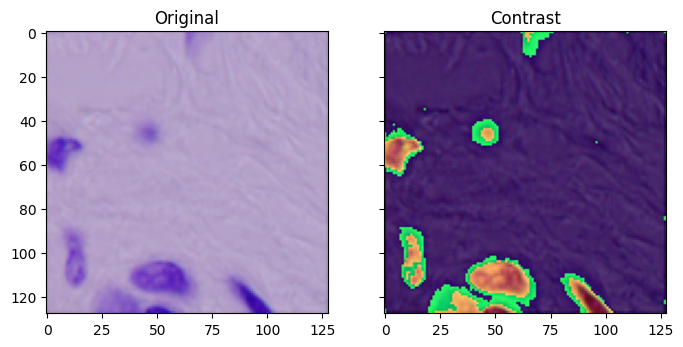

In [19]:
#High contrast images
X_contrast = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
for i in range(0, len(X)):
    X_contrast[i] = X[i] * 1.8

for i in range(1, 5):
    fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True,
                         figsize=(8, 4))
    axes[0].imshow(X[i])
    axes[0].set_title('Original')
    axes[1].imshow(X_contrast[i])
    axes[1].set_title('Contrast')

### Greyscale + Edge detector: 
Best performing yet, in the purple ones that have texture, adds a little bit of ghosting but nothing fancy. Also from all tested, best performing Sobel and Canny is unusable.  
https://scikit-image.org/docs/stable/auto_examples/edges/plot_edge_filter.html

/tmp/ipykernel_7698/259192934.py:8: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  edges_sobel[i] = filters.sobel(X_greyscale[i].astype(np.float))
/tmp/ipykernel_7698/259192934.py:9: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  edges_roberts[i] = filters.roberts(X_greyscale[i].astype(np.float))
/tmp/ipykernel_7698/259192934.py:10: Depreca

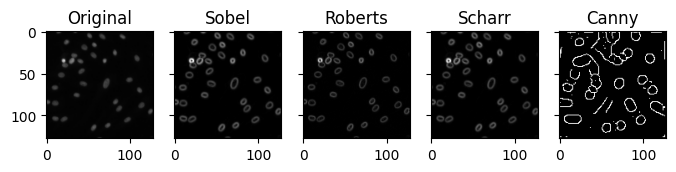

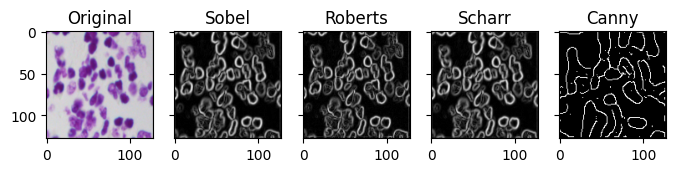

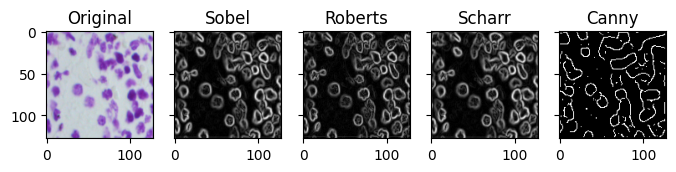

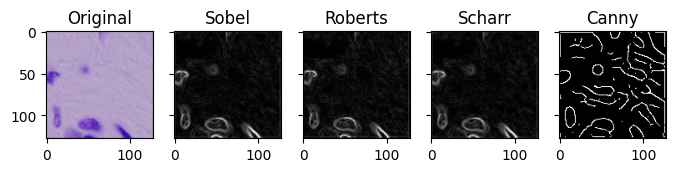

In [20]:
from skimage import filters, feature

edges_sobel = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)
edges_roberts = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)
edges_scharr = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)
edges_canny = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)
for i in range(0, len(X)):
    edges_sobel[i] = filters.sobel(X_greyscale[i].astype(np.float))
    edges_roberts[i] = filters.roberts(X_greyscale[i].astype(np.float))
    edges_scharr[i] = filters.scharr(X_greyscale[i].astype(np.float))
    edges_canny[i] = feature.canny(X_greyscale[i].astype(np.float), sigma=5)


for i in range(1, 5):
    fig, axes = plt.subplots(ncols=5, sharex=True, sharey=True,
                         figsize=(8, 4))
    axes[0].imshow(X[i], cmap=plt.get_cmap('gray'))
    axes[0].set_title('Original')
    axes[1].imshow(edges_sobel[i], cmap=plt.get_cmap('gray'))
    axes[1].set_title('Sobel')
    axes[2].imshow(edges_roberts[i], cmap=plt.get_cmap('gray'))
    axes[2].set_title('Roberts')
    axes[3].imshow(edges_scharr[i], cmap=plt.get_cmap('gray'))
    axes[3].set_title('Scharr')
    axes[4].imshow(edges_canny[i], cmap=plt.get_cmap('gray'))
    axes[4].set_title('Canny')
    plt.show()

### Gaussian Noise:
Adds noise to the image, but not in a way that is useful for us. Did not make it work

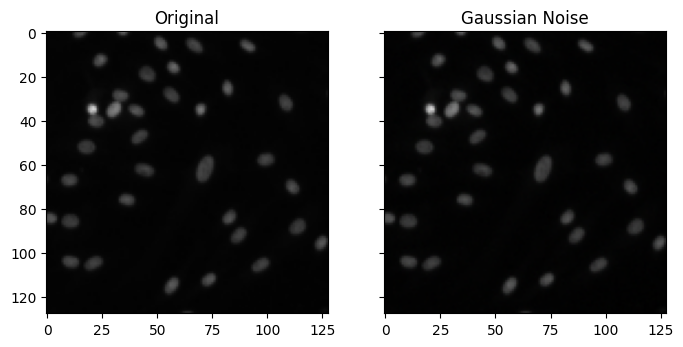

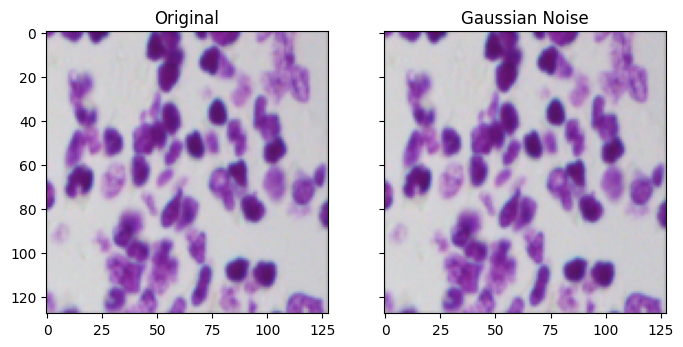

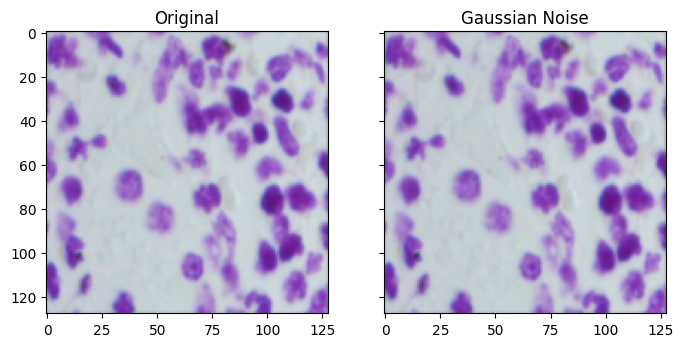

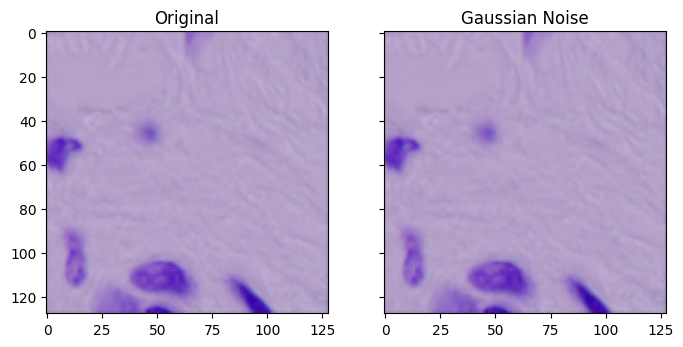

In [21]:
from skimage.util import random_noise

X_gauss = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
for i in range(0, len(X)):
    gaussian = np.random.normal(0, 0.5, (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    X_gauss[i] = X[i] + gaussian

for i in range(1, 5):
    fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True,
                         figsize=(8, 4))
    axes[0].imshow(X[i], cmap=plt.get_cmap('gray'))
    axes[0].set_title('Original')
    noise_img = np.array(X_gauss[i], dtype=np.uint8)
    axes[1].imshow(noise_img)
    axes[1].set_title('Gaussian Noise')

### Greyscale + Gaussian Noise:

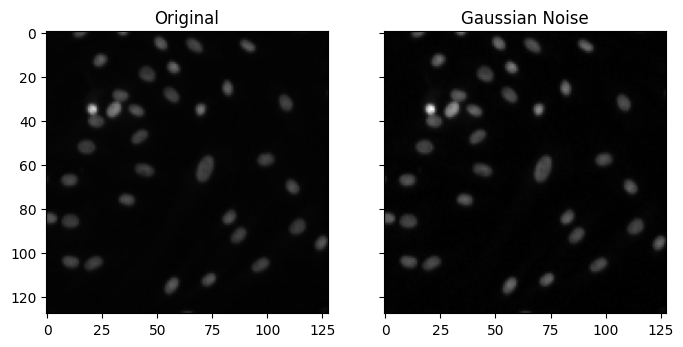

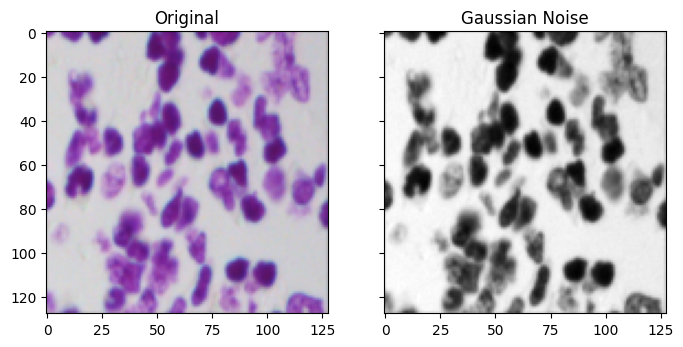

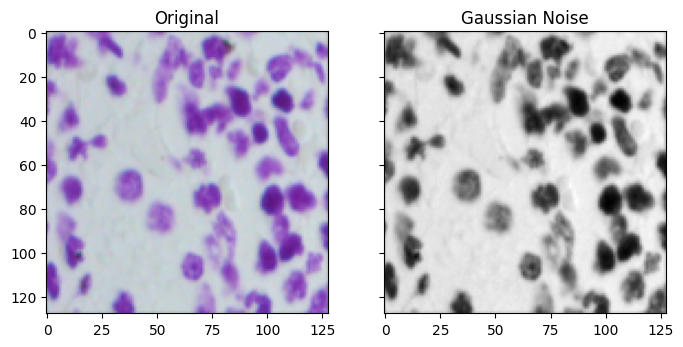

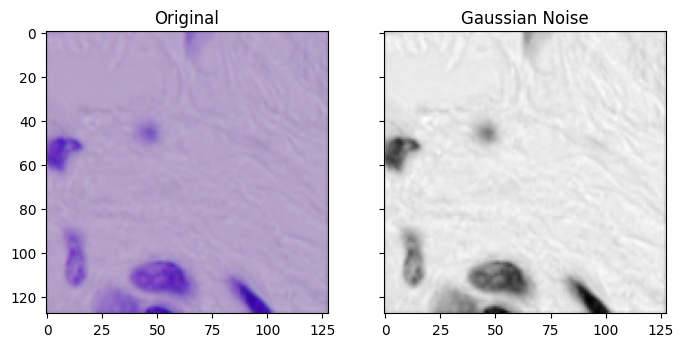

In [22]:
from skimage.util import random_noise

X_grey_gauss = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)
for i in range(0, len(X)):
    gaussian = np.random.normal(0, 0.5, (IMG_HEIGHT, IMG_WIDTH))
    X_grey_gauss[i] = X_greyscale[i] + gaussian

for i in range(1, 5):
    fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True,
                         figsize=(8, 4))
    axes[0].imshow(X[i], cmap=plt.get_cmap('gray'))
    axes[0].set_title('Original')
    axes[1].imshow(X_grey_gauss[i], cmap=plt.get_cmap('gray'))
    axes[1].set_title('Gaussian Noise')

### Rotation:
Random rotation of image.

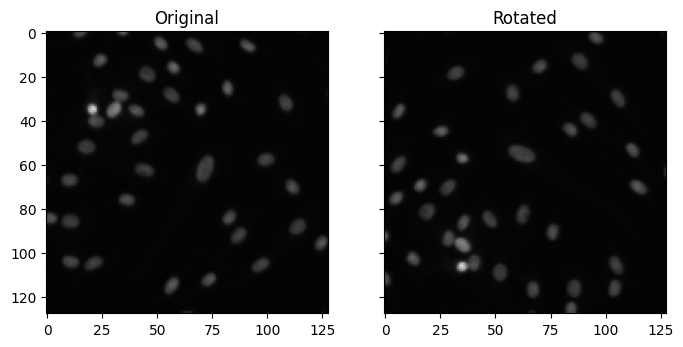

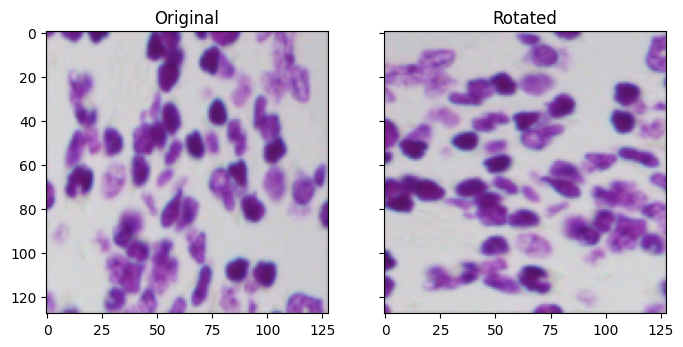

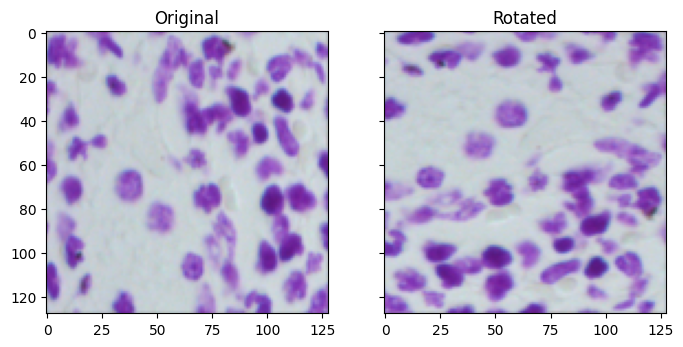

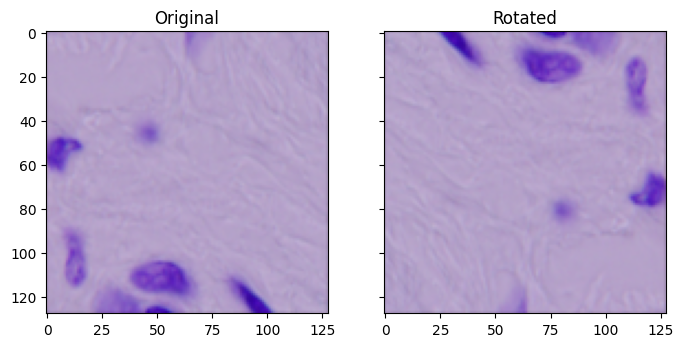

In [23]:
X_rotated = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
for i in range(0, len(X)):
    X_rotated[i] = np.rot90(X[i], random.randint(1, 3))

for i in range(1, 5):
    fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True,
                         figsize=(8, 4))
    axes[0].imshow(X[i], cmap=plt.get_cmap('gray'))
    axes[0].set_title('Original')
    axes[1].imshow(X_rotated[i], cmap=plt.get_cmap('gray'))
    axes[1].set_title('Rotated')
    

### Normalization:


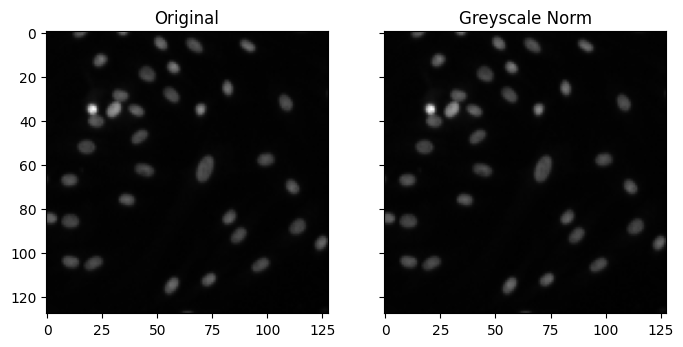

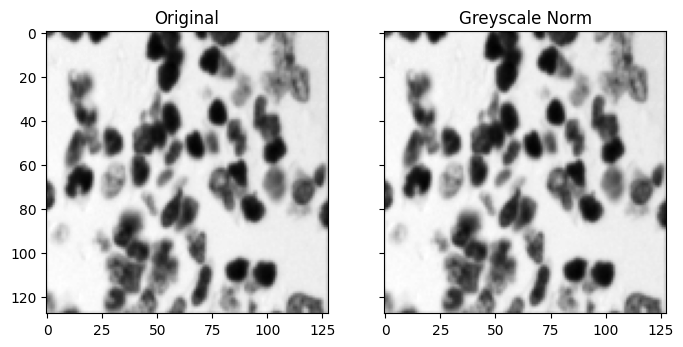

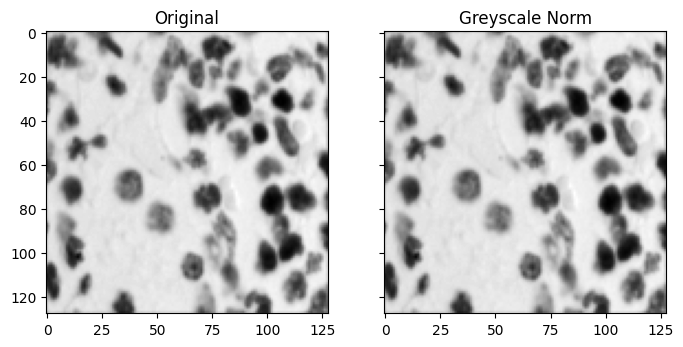

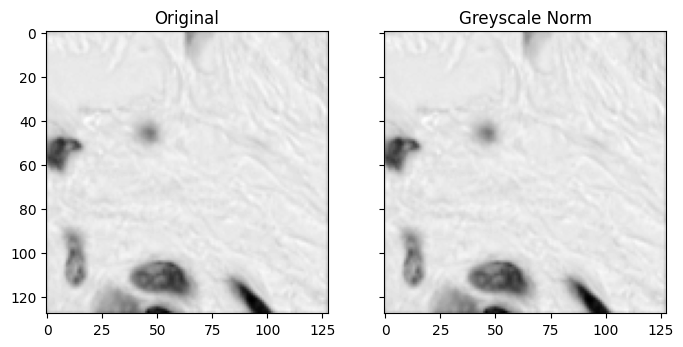

In [24]:
# Normalize the greyscale images
X_greyscale_norm = X_greyscale / 255.0

for i in range(1, 5):
    fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True,
                         figsize=(8, 4))
    axes[0].imshow(X_greyscale[i], cmap=plt.get_cmap('gray'))
    axes[0].set_title('Original')
    axes[1].imshow(X_greyscale_norm[i], cmap=plt.get_cmap('gray'))
    axes[1].set_title('Greyscale Norm')

### Foreground Normalization:
Did not make it work.
https://journals.plos.org/ploscompbiol/article/file?id=10.1371/journal.pcbi.1008193&type=printable

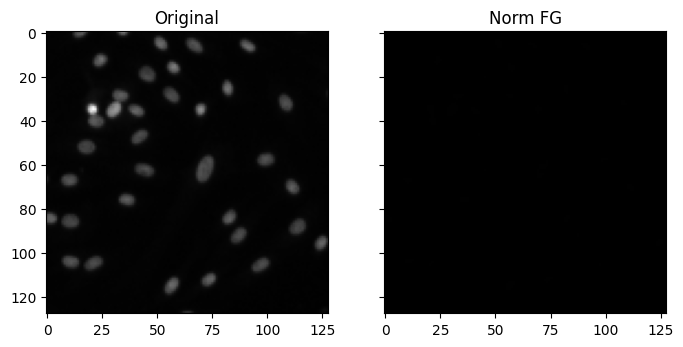

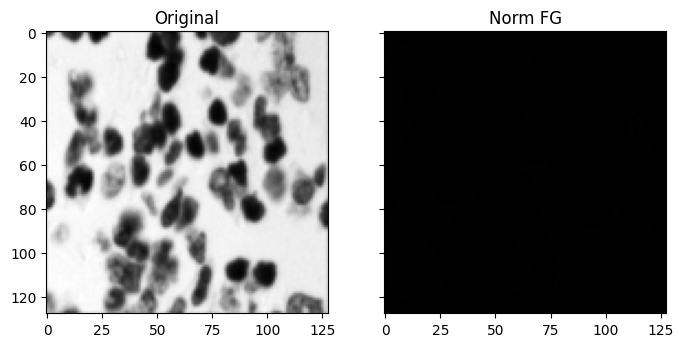

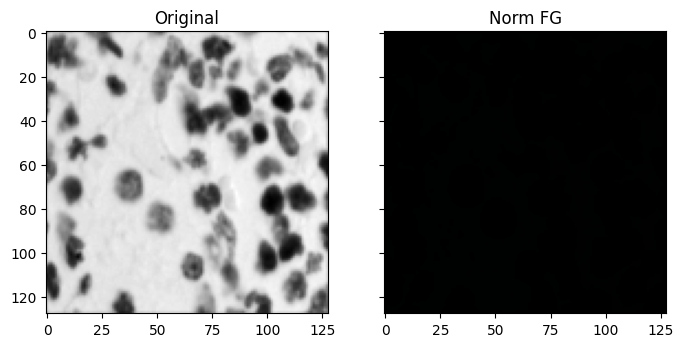

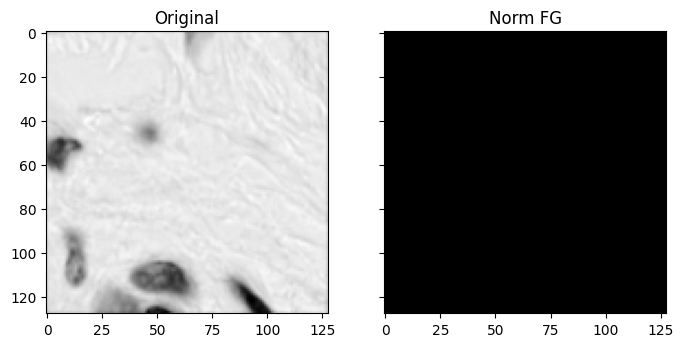

In [25]:
from skimage.filters import threshold_otsu

# Foreground normalization for greyscale images
X_norm_fg = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
for i in range(0, len(X)):
    image = X[i]
    gray = X_greyscale[i]
    # Threshold the grayscale image to create a binary mask
    thresh = threshold_otsu(gray)
    mask = gray > thresh

    # Calculate the mean intensity of the foreground pixels
    mean_intensity = np.mean(image[mask])

    # Normalize the foreground pixels
    normalized = image / mean_intensity

    # Clip the normalized values to the range [0, 1]
    X_norm_fg[i] = np.clip(normalized, 0, 1)

for i in range(1, 5):
    fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True,
                         figsize=(8, 4))
    axes[0].imshow(X_greyscale[i], cmap=plt.get_cmap('gray'))
    axes[0].set_title('Original')
    axes[1].imshow(X_norm_fg[i], cmap=plt.get_cmap('gray'))
    axes[1].set_title('Norm FG')

### Contrast Limited Adaptive Histogram Equalization

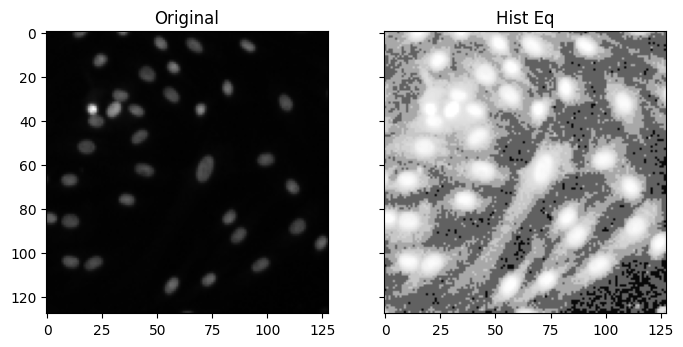

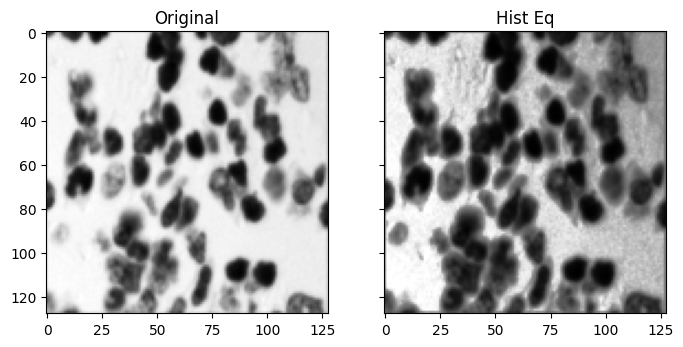

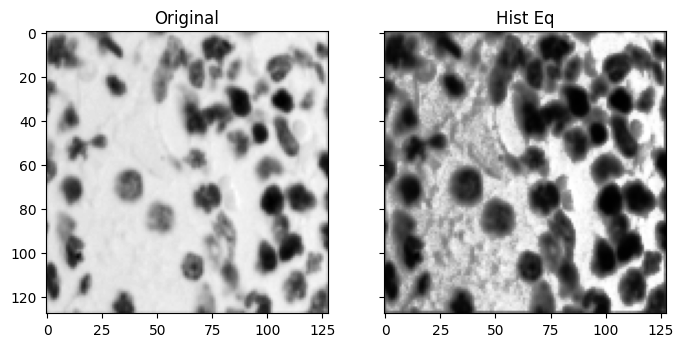

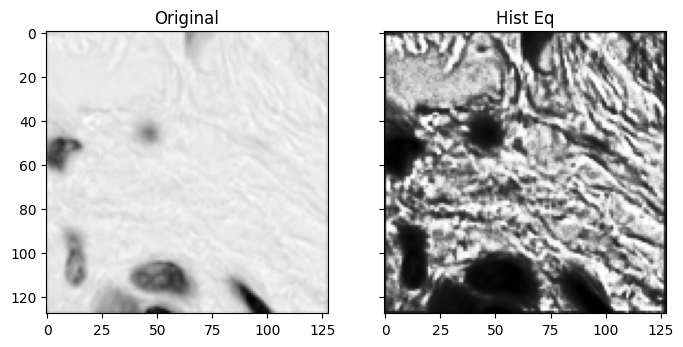

In [26]:
import cv2

X_hist_eq = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)
for i in range(0, len(X)):
    X_hist_eq[i] = cv2.equalizeHist(X_greyscale[i])

for i in range(1, 5):
    fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True,
                         figsize=(8, 4))
    axes[0].imshow(X_greyscale[i], cmap=plt.get_cmap('gray'))
    axes[0].set_title('Original')
    axes[1].imshow(X_hist_eq[i], cmap=plt.get_cmap('gray'))
    axes[1].set_title('Hist Eq')

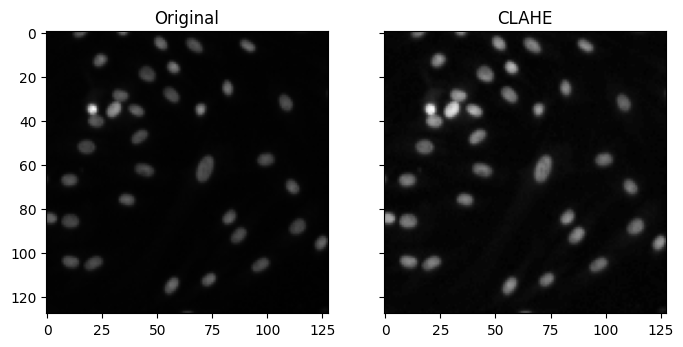

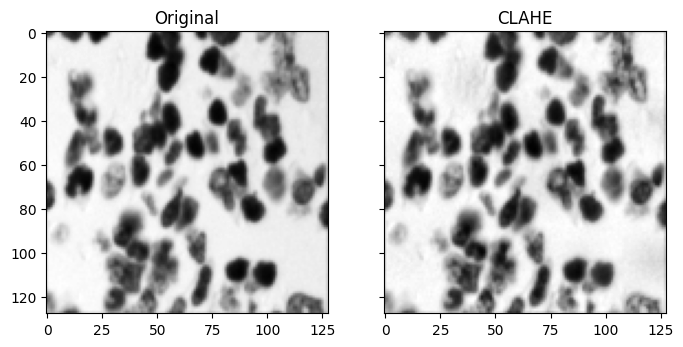

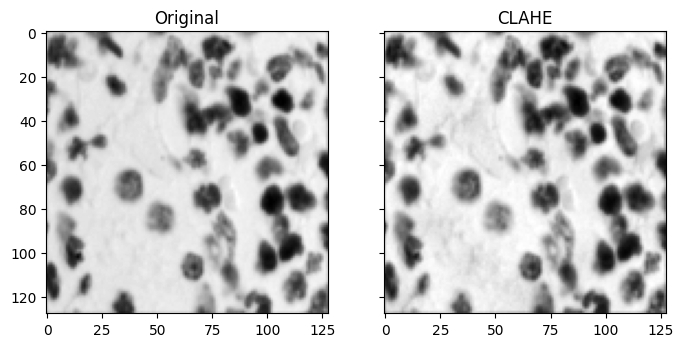

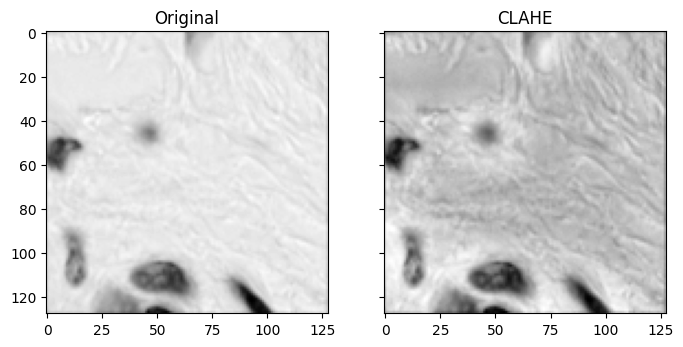

In [27]:
X_clahe = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)
for i in range(0, len(X)):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    X_clahe[i] = clahe.apply(X_greyscale[i])

for i in range(1, 5):
    fig, axes = plt.subplots(ncols=2, sharex=True, sharey=True,
                            figsize=(8, 4))
    axes[0].imshow(X_greyscale[i], cmap=plt.get_cmap('gray'))
    axes[0].set_title('Original')
    axes[1].imshow(X_clahe[i], cmap=plt.get_cmap('gray'))
    axes[1].set_title('CLAHE')

## Unsupervised Classifcation

In [28]:
from sklearn.cluster import KMeans

def save_cluster(image, kmeans, n_clusters):    
    #Empty all folders
    for i in range(0, n_clusters):
        folder = 'cluster' + str(i)
        for filename in os.listdir(folder):
            file_path = os.path.join(folder, filename)
            try:
                if os.path.isfile(file_path) or os.path.islink(file_path):
                    os.unlink(file_path)
            except Exception as e:
                print('Failed to delete %s. Reason: %s' % (file_path, e))
    for i in range(0, len(image)):
        if kmeans.labels_[i] == 0 and n_clusters >= 1:
            plt.imsave('cluster0/' + str(i) + '.png', image[i])
        elif kmeans.labels_[i] == 1 and n_clusters >= 2:
            plt.imsave('cluster1/' + str(i) + '.png', image[i])
        elif kmeans.labels_[i] == 2 and n_clusters >= 3:
            plt.imsave('cluster2/' + str(i) + '.png', image[i])
        elif kmeans.labels_[i] == 3 and n_clusters >= 4:
            plt.imsave('cluster3/' + str(i) + '.png', image[i])
        elif kmeans.labels_[i] == 4 and n_clusters >= 5:
            plt.imsave('cluster4/' + str(i) + '.png', image[i])
        elif kmeans.labels_[i] == 5 and n_clusters >= 6:
            plt.imsave('cluster5/' + str(i) + '.png', image[i])

Clustering edge images

In [29]:
#K-means clustering using edges_sobel images
kmeans = KMeans(n_clusters=4, random_state=0).fit(edges_sobel.reshape(len(X), -1))

print(kmeans.labels_)

/root/miniconda3/envs/tf/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[0 0 2 3 1 0 1 0 0 0 0 3 1 0 0 1 0 0 0 0 0 3 0 3 0 1 1 0 0 0 0 1 1 0 2 0 0
 1 0 1 2 0 2 0 0 0 0 3 3 1 0 0 3 0 0 3 3 0 3 0 0 1 0 3 2 1 0 0 0 3 1 1 0 0
 1 1 1 0 0 0 1 0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 3 1 0 0 0 1 1 1 0 0 0 0 0 0 1
 0 1 0 1 0 0 0 0 1 0 0 1 0 0 2 0 1 1 3 1 3 0 1 0 0 1 1 0 3 3 0 0 1 0 1 3 1
 1 1 1 0 0 1 1 0 1 0 1 0 0 0 0 0 0 1 3 0 0 0 1 3 1 0 0 1 1 3 3 0 0 1 3 1 1
 0 1 2 1 0 0 3 0 0 0 0 1 1 0 1 0 1 1 0 1 3 1 1 1 1 3 3 3 1 3 1 0 0 0 0 0 3
 0 1 0 1 3 0 0 0 1 0 1 0 0 0 0 3 0 0 1 0 1 1 0 3 0 0 0 1 0 1 0 0 3 0 0 0 3
 2 1 1 1 1 0 0 0 0 2 0 0 0 1 1 0 0 0 3 3 3 0 0 0 0 0 0 0 3 1 1 1 0 1 0 1 0
 3 0 3 0 1 0 0 1 3 0 3 3 3 0 0 0 0 0 0 1 1 0 1 3 0 3 0 0 0 0 0 2 1 1 0 0 2
 1 0 0 0 0 1 3 3 0 2 0 0 0 1 0 0 0 0 0 3 0 0 1 3 0 1 0 0 0 0 0 0 0 1 1 3 1
 0 0 0 0 0 3 3 0 1 1 0 0 0 0 1 0 0 1 2 3 0 0 1 1 3 1 0 0 0 1 0 0 0 2 1 0 0
 0 0 1 1 0 0 3 1 0 3 0 0 1 0 0 0 0 0 0 3 0 0 0 3 0 0 3 0 1 0 1 0 1 3 1 0 3
 3 1 1 0 0 3 0 1 0 0 1 0 0 3 0 0 1 1 0 1 0 0 0 0 1 0 0 0 1 2 3 0 0 0 0 0 0
 0 0 3 0 0 0 0 0 0 0 0 1 

In [30]:
#save_cluster(edges_sobel, kmeans, 4)

In [31]:
def create_dataset(image, kmeans, n_clusters):
    X = np.zeros((len(image), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
    y = np.zeros((len(image)), dtype=np.uint8)
    for i in range(0, len(image)):
        X[i] = image[i]
        y[i] = kmeans.labels_[i]
    return X, y

In [32]:
#X_split, y_split = create_dataset(edges_sobel, kmeans, 4)

Use VGG16 weights, extract image pseudo-features, and run some clustering on this feature set.

In [33]:
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions

model = VGG16(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

featureslist = []
for i in range(0, len(X)):
    try:
        img_data = np.expand_dims(X[i], axis=0)
        #print(img_data.shape)
        img_data = preprocess_input(img_data)
        features = np.array(model.predict(img_data))
        featureslist.append(features.flatten())
    except:
        continue
n_clusters = 6
# Three labels: Big, small and one nuclei
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(np.array(featureslist))

2023-05-03 20:33:53.011638: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-05-03 20:33:53.011837: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /root/miniconda3/envs/tf/lib/python3.9/site-packages/cv2/../../lib64:
2023-05-03 20:33:53.011989: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /root/miniconda3/envs/tf/lib/python3.9/site-packages/cv2/../../lib64:
2023-05-03 20:33:53.012068: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64]

1/1 [==============================] - 0s 66ms/step


/root/miniconda3/envs/tf/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [34]:
print(kmeans.labels_)

print(kmeans.labels_.shape)

#save_cluster(X, kmeans, n_clusters)

[0 0 4 4 4 3 0 5 3 5 5 0 1 0 5 3 0 5 3 3 3 1 5 2 3 2 3 0 3 3 3 3 4 0 4 0 5
 4 0 4 4 0 1 5 0 1 3 1 0 4 3 3 4 3 5 4 1 5 4 3 3 1 3 1 0 2 5 3 3 2 1 0 5 3
 0 1 4 0 3 3 4 3 3 4 3 5 1 0 3 3 0 0 1 3 3 0 4 4 3 3 0 3 0 4 0 3 5 5 5 3 0
 3 2 5 0 3 3 3 3 4 3 5 1 3 3 4 3 5 0 4 0 0 3 0 3 0 0 3 5 4 4 3 5 0 3 1 4 0
 3 0 2 0 3 0 3 3 4 5 0 0 3 4 0 3 0 3 4 0 5 3 1 1 4 3 3 0 4 4 2 3 5 0 4 0 0
 0 0 4 1 3 5 4 3 3 5 1 0 4 3 3 5 1 4 4 0 4 1 3 0 4 1 2 0 4 4 0 3 5 5 5 3 4
 3 1 3 2 1 5 3 3 4 0 0 5 0 3 5 4 0 5 4 3 0 0 0 1 5 3 3 0 5 0 5 5 4 3 0 0 2
 4 3 2 4 1 3 3 3 0 4 0 0 0 1 1 0 3 5 0 0 4 5 3 5 4 3 0 3 4 0 4 1 0 1 5 0 5
 4 3 4 0 0 3 5 1 1 5 4 4 4 3 3 3 4 0 0 2 3 5 1 4 5 4 0 3 5 5 5 4 0 0 3 3 0
 0 3 5 0 5 1 4 2 3 4 5 3 3 4 3 3 5 3 3 4 3 5 1 4 3 0 5 0 3 3 3 3 3 0 1 2 0
 0 3 4 3 3 1 4 3 1 2 0 3 3 4 0 3 3 0 4 4 3 0 4 1 0 1 5 3 3 1 0 3 3 1 0 3 3
 0 3 0 5 0 5 4 0 3 4 4 5 0 3 3 5 3 0 0 4 3 3 1 4 3 0 4 3 0 3 1 5 1 4 4 3 1
 4 1 1 0 3 4 3 1 0 3 4 5 5 4 0 5 4 0 4 4 0 3 0 5 4 5 3 3 1 4 0 3 0 3 5 3 3
 5 3 1 3 5 0 5 1 3 0 0 4 

In [35]:
X_split, y_split = create_dataset(X, kmeans, n_clusters)

In [36]:
print(X_split.shape)
print(y_split.shape)

(670, 128, 128, 3)
(670,)


Number of images in each label:

In [37]:
df_labels = pd.DataFrame({'labels': kmeans.labels_})
print(df_labels['labels'].value_counts())


3    211
0    172
4    108
5     97
1     66
2     16
Name: labels, dtype: int64


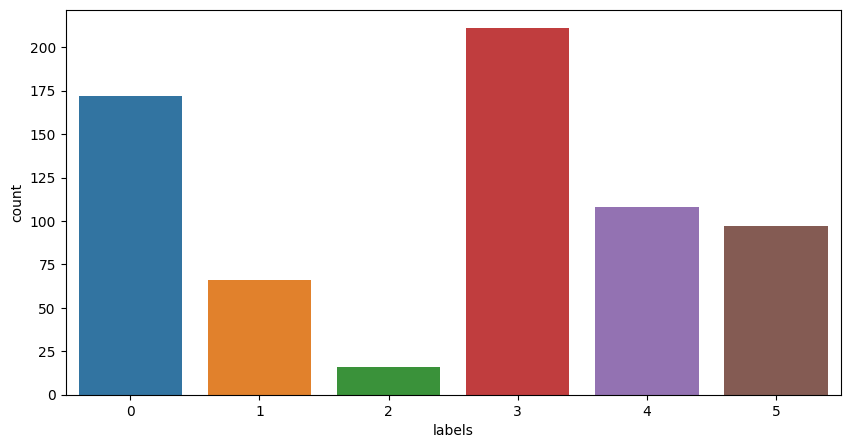

In [38]:
plt.figure(figsize=(10, 5))
sns.countplot(x=df_labels['labels'])
plt.show()

## Preprocessing
Images are resized to 128x128, masked, transformed to grey and brightness is increased 

In [39]:
def pipeline(X):
    X_greyscale_bright = np.zeros((len(X), IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)
    for i in range(0, len(X)):
        X_greyscale_bright[i] = np.dot(X[i][...,:3], [0.2989, 0.5870, 0.1140])
        X_greyscale_bright[i] = X_greyscale_bright[i] + 25

    return X_greyscale_bright

In [57]:
X_processed = pipeline(X_split)
#Add one channel to the images
X_processed = np.expand_dims(X_processed, axis=3)
y_processed = y

(128, 128, 1)


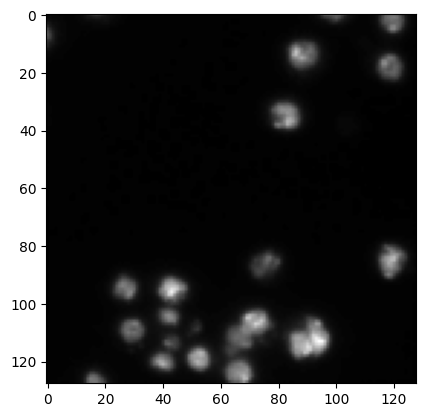

In [41]:
plt.imshow(X_processed[0], cmap=plt.get_cmap('gray'))
print(X_processed[0].shape)

## Split

In [58]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X_processed, y_processed, test_size=0.1, random_state=42, stratify=y_split)

In [59]:
print(X_train.shape)
print(X_val.shape)
print(y_train.shape)
print(y_val.shape)
print(X_train[0].shape)

(603, 128, 128, 1)
(67, 128, 128, 1)
(603, 128, 128, 1)
(67, 128, 128, 1)
(128, 128, 1)


## U-Net Baseline

https://www.kaggle.com/code/piyushnagpal/unet-implementation

In [44]:
# The convolation block 
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    return x

In [45]:
# The encoder block
def encoder_block(input, num_filters):
    x = conv_block(input, num_filters)
    p = MaxPool2D((2, 2))(x)
    
    return x, p

In [46]:
# The decoder block
def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)

    return x

In [47]:
def unet_baseline(input_shape):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 16)
    s2, p2 = encoder_block(p1, 32)

    b1 = conv_block(p2, 64)

    d1 = decoder_block(b1, s2, 32)
    d2 = decoder_block(d1, s1, 16)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d2)

    modelUnet = Model(inputs=inputs, outputs=outputs, name="BaselineUNET")

    modelUnet.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return modelUnet

In [60]:
batch_size = 64
batches_per_epoch = int(len(train_ids)/batch_size) 
epochs = 10
LR = 0.001

model = unet_baseline((128, 128, 1))
model.summary()

history = model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, validation_data=(X_val, y_val), callbacks=tf.keras.callbacks.TensorBoard(log_dir='./logs'))

model_savepath = "helloWolrd"  

Model: "BaselineUNET"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_11 (Conv2D)             (None, 128, 128, 16  160         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_10 (BatchN  (None, 128, 128, 16  64         ['conv2d_11[0][0]']              
 ormalization)                  )                                                      

In [52]:
model.save(model_savepath)

INFO:tensorflow:Assets written to: helloWolrd/assets


INFO:tensorflow:Assets written to: helloWolrd/assets


In [49]:
def plot(history):
    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='validation')
    plt.title('Loss')
    plt.legend()
    plt.subplot(1,2,2)
    plt.plot(history.history['accuracy'], label='train')
    plt.plot(history.history['val_accuracy'], label='validation')
    plt.title('Accuracy')
    plt.legend()
    plt.show()

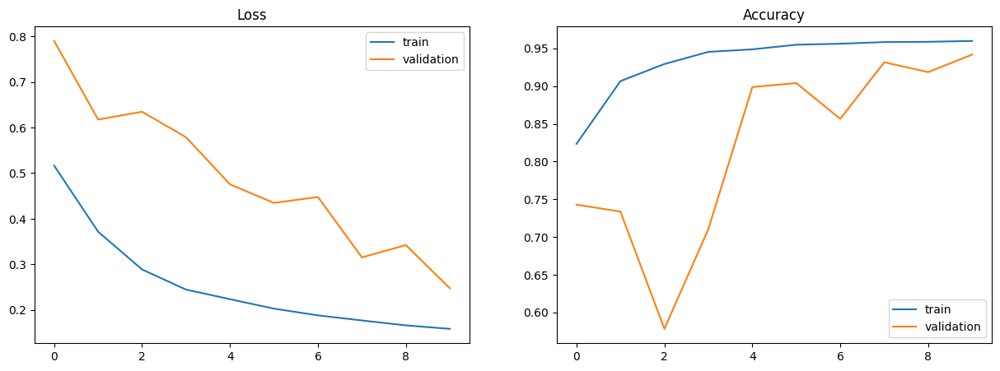

In [50]:
plot(history)

1/1 [==============================] - 0s 440ms/step


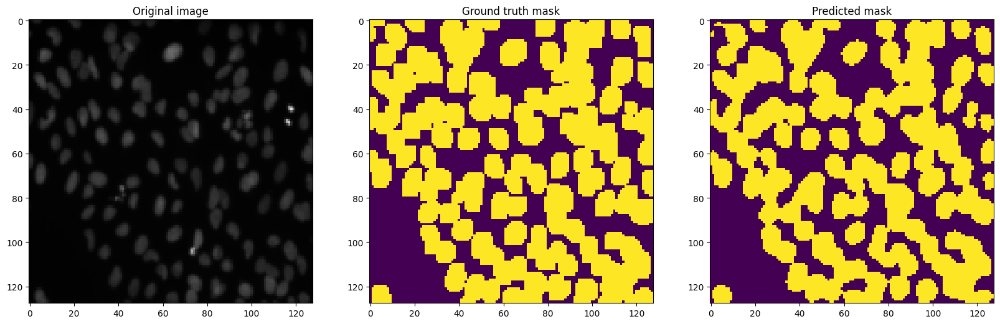

In [51]:
# Test predictions in random train image
idx = random.randint(0, len(X_train))

preds_train = model.predict(X_train[idx:idx+1], verbose=1)

preds_train_t = (preds_train > 0.5).astype(np.uint8)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(X_train[idx])
plt.subplot(1,3,2)
plt.title('Ground truth mask')
plt.imshow(np.squeeze(y_train[idx]))
plt.subplot(1,3,3)
plt.title('Predicted mask')
plt.imshow(np.squeeze(preds_train_t))
plt.show()

https://arxiv.org/pdf/1505.04597.pdf